I0: 000003_10.png
I1: 000003_11.png
FOE: [551.68756 198.09549]
Camera is moving.


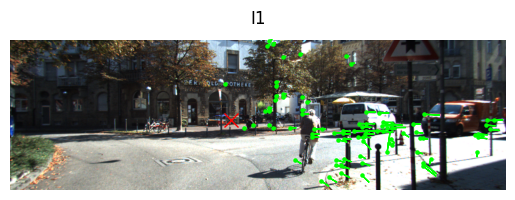

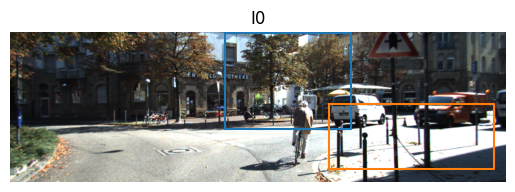

I0: 000005_10.png
I1: 000005_11.png
FOE: [587.476   168.05385]
Camera is moving.


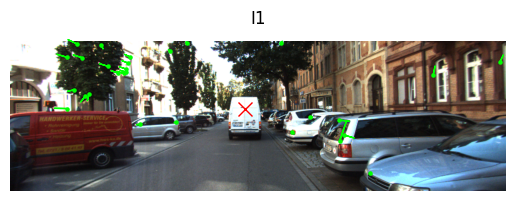

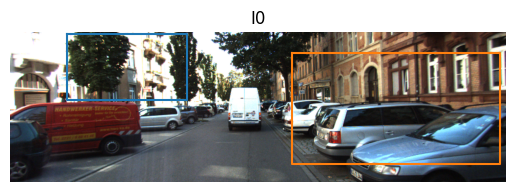

I0: 000017_10.png
I1: 000017_11.png
FOE: [722.2388 198.1188]
Camera is moving.


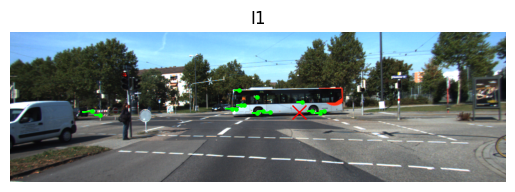

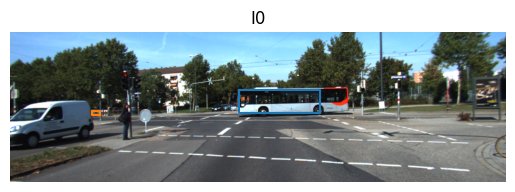

I0: 000020_10.png
I1: 000020_11.png
FOE: [483.40723 189.69563]
Camera is moving.


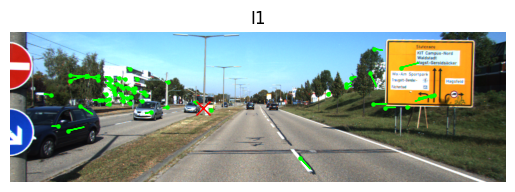

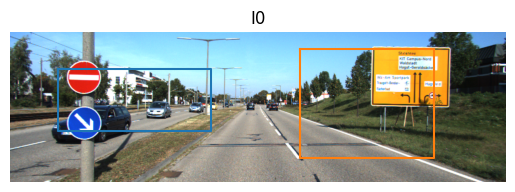

I0: 000035_10.png
I1: 000035_11.png
FOE: [436.241   199.05536]
Camera is moving.


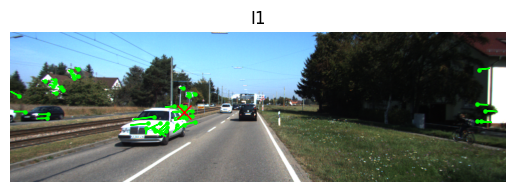

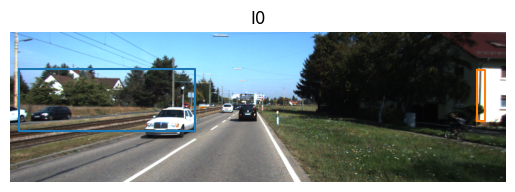

I0: 000066_10.png
I1: 000066_11.png
FOE: [658.932  177.1224]
Camera is moving.


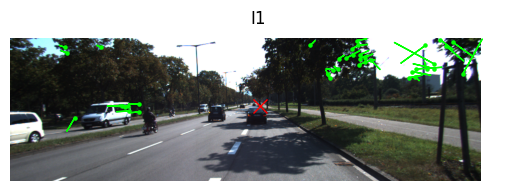

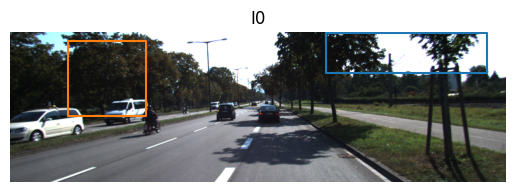

I0: 000067_10.png
I1: 000067_11.png
FOE: [720.6231  157.29433]
Camera is moving.


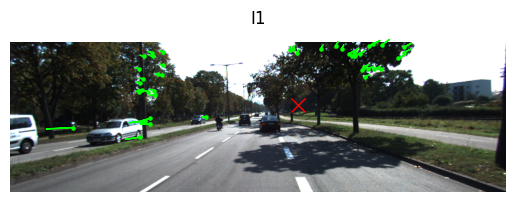

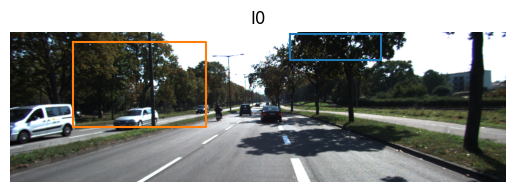

I0: 000101_10.png
I1: 000101_11.png
FOE: [612.35114 183.78038]
Camera is moving.


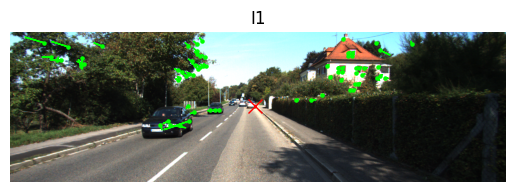

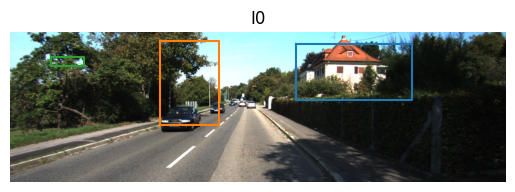

I0: 000102_10.png
I1: 000102_11.png
FOE: [583.4748 264.9497]
Camera is moving.


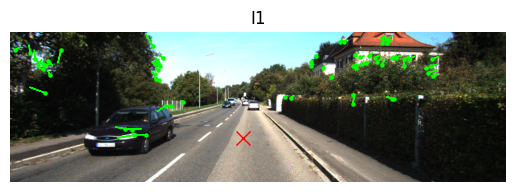

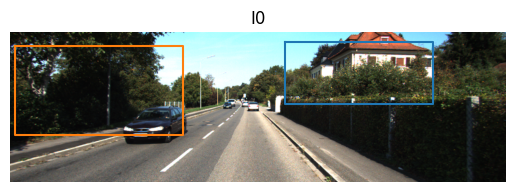

I0: 000105_10.png
I1: 000105_11.png
FOE: [1168.3826    88.99232]
Camera is moving.


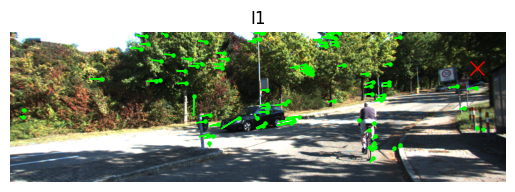

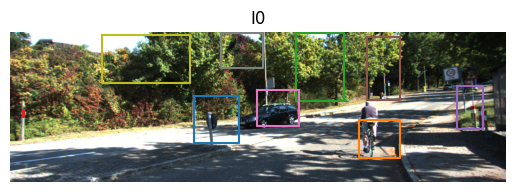

I0: 000109_10.png
I1: 000109_11.png
FOE: [701.86365   43.851723]
Camera is moving.


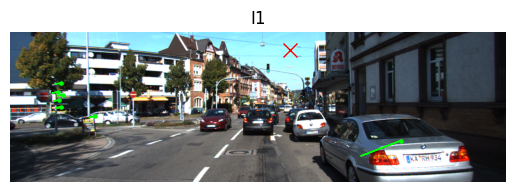

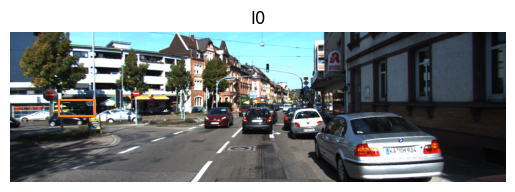

I0: 000110_10.png
I1: 000110_11.png
FOE: [201.19759 182.78406]
Camera is moving.


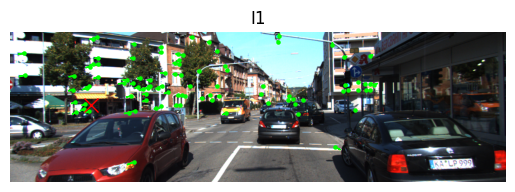

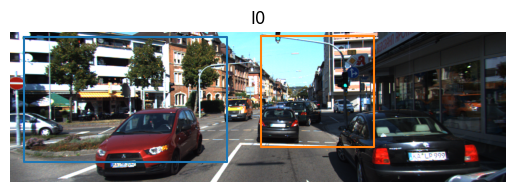

I0: 000123_10.png
I1: 000123_11.png
FOE: [605.4092  227.78331]
Camera is moving.


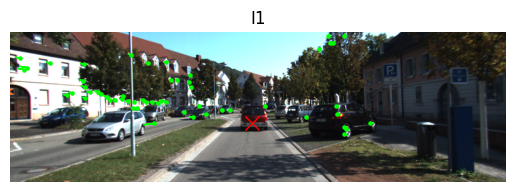

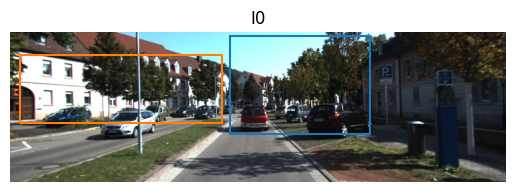

I0: 000130_10.png
I1: 000130_11.png
FOE: [818.45654   54.415283]
Camera is moving.


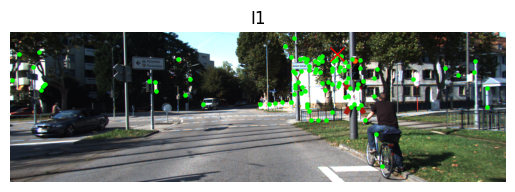

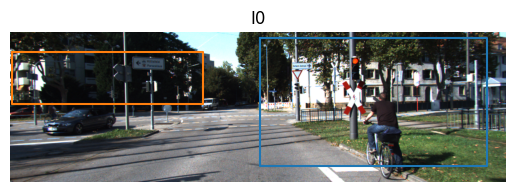

I0: 000131_10.png
I1: 000131_11.png
FOE: None
Camera is not moving above the threshold.


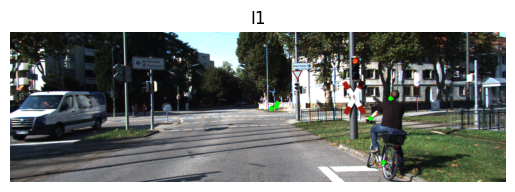

I0: 000149_10.png
I1: 000149_11.png
FOE: [1157.3016   235.06703]
Camera is moving.


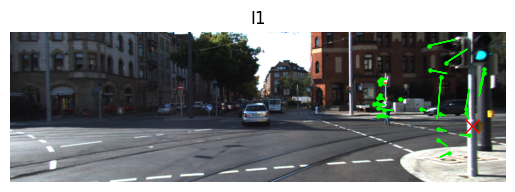

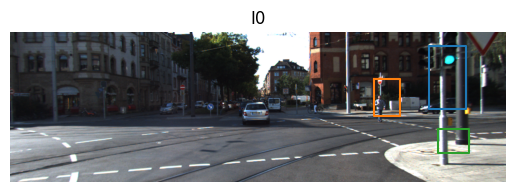

I0: 000150_10.png
I1: 000150_11.png
FOE: [696.5514 127.7085]
Camera is moving.


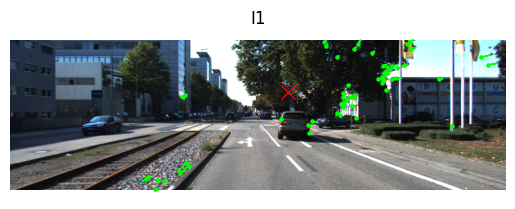

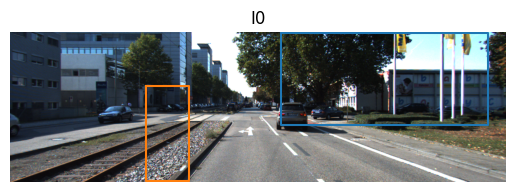

I0: 000151_10.png
I1: 000151_11.png
FOE: [1228.6891       8.0511055]
Camera is moving.


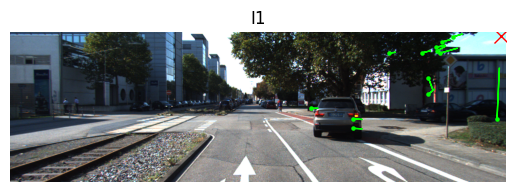

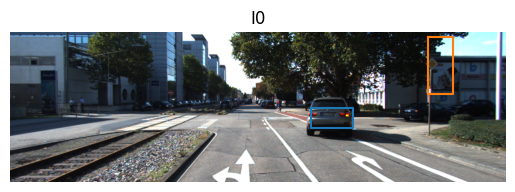

I0: 000169_10.png
I1: 000169_10_0.png
FOE: [1053.8685   174.73624]
Camera is moving.


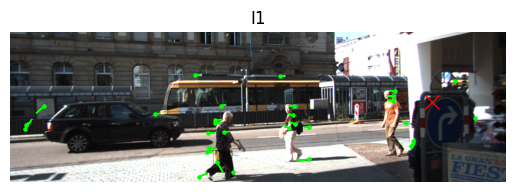

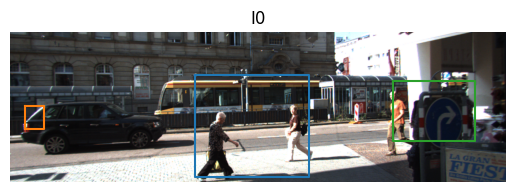

I0: 000169_10_1.png
I1: 000169_10_2.png
FOE: [636.30994 157.32716]
Camera is moving.


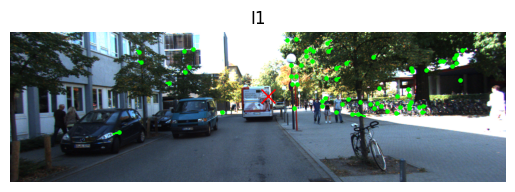

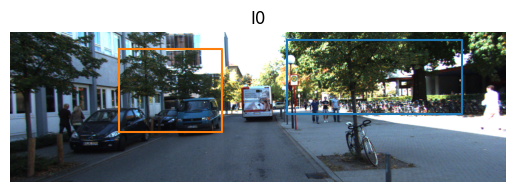

I0: 000170_10.png
I1: 000170_11.png
FOE: [614.97626 168.27573]
Camera is moving.


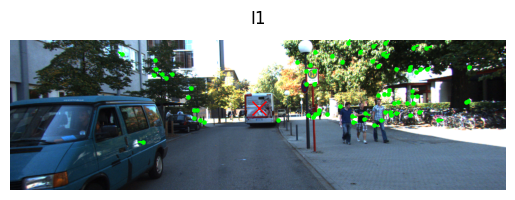

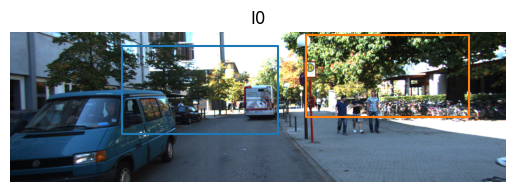

I0: 000182_10.png
I1: 000182_11.png
FOE: [626.7887  176.05318]
Camera is moving.


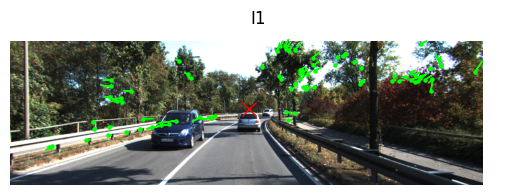

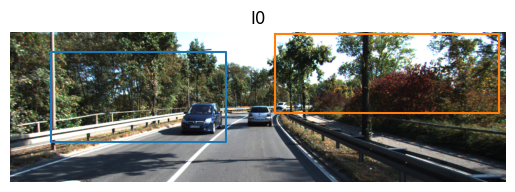

I0: 000186_10.png
I1: 000186_11.png
FOE: [570.3729  163.40732]
Camera is moving.


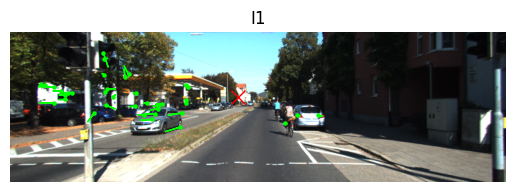

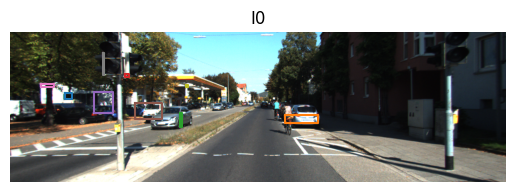

I0: 000198_10.png
I1: 000198_11.png
FOE: [600.69086 169.88478]
Camera is moving.


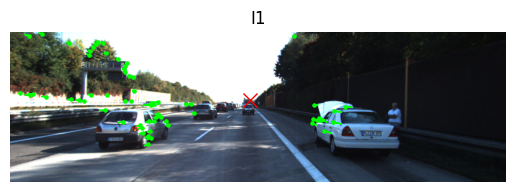

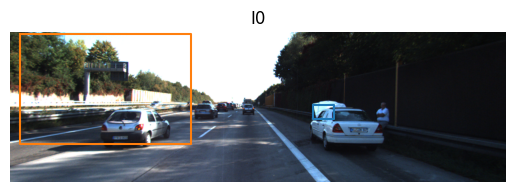

I0: 000199_10.png
I1: 000199_11.png
FOE: [637.1763 160.855 ]
Camera is moving.


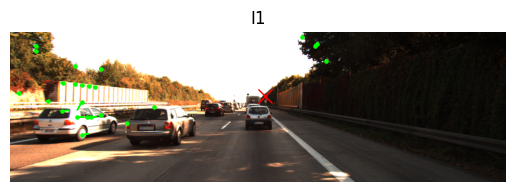

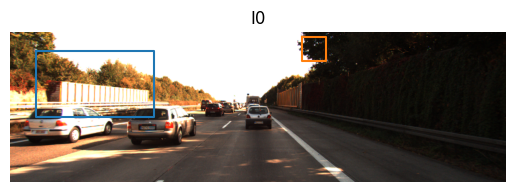

In [103]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import metrics



# Load input images
PATH = "hw6data/"


def load_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Error loading image: {image_path}")
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return RGB_img
    
def motion_points(image):
    gray0 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    feature_params = dict(maxCorners=100, qualityLevel=0.3, minDistance=7, blockSize=7)
    p0 = cv2.goodFeaturesToTrack(gray0, mask=None, **feature_params)
    return p0

def get_motion_vectors(I0, I1, p0):
    gray0 = cv2.cvtColor(I0, cv2.COLOR_BGR2GRAY)
    gray1 = cv2.cvtColor(I1, cv2.COLOR_BGR2GRAY)

    if gray0.shape != gray1.shape:
        gray0 = cv2.resize(gray0, (gray1.shape[1], gray1.shape[0]))

    lk_params = dict(winSize=(15, 15), maxLevel=2, criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 0.03)) 
    p1, st, err = cv2.calcOpticalFlowPyrLK(gray0, gray1, p0, None, **lk_params)

    filtered_p0 = p0[st == 1]
    filtered_p1 = p1[st == 1]

    mv = filtered_p1 - filtered_p0
    motion_len = np.linalg.norm(mv, axis=1)
    motion_thresh = np.max(motion_len) * 0.1
    mv_filtered = mv[motion_len > motion_thresh]
    filtered_p0 = filtered_p0[motion_len > motion_thresh]
    filtered_p1 = filtered_p1[motion_len > motion_thresh]

    return mv_filtered, filtered_p0, filtered_p1

def intersection_point(start1, end1, start2, end2):
    m1 = end1 - start1
    m2 = end2 - start2
    direction_dot = np.dot(m1, m2)
    if abs(direction_dot) < 1e-6:
        return None  # parallel 
    direction_cross = np.cross(m1, m2)
    if np.allclose(direction_cross, 0): 
        return None  # collinear
    b = np.cross(start2 - start1, m2) / direction_cross
    p = start1 + b * m1
    return p


def ransac(p0, p1, I0, threshold=3):
    best_foe = None
    best_inliers = 0
    best_outliers = []

    for i in range(100):        
        ind1, ind2 = np.random.randint(0, len(p0), 2)

        if ind1 == ind2:
            continue
            
        vec11 = p0[ind1]
        vec12 = p1[ind1]
        vec21 = p0[ind2]
        vec22 = p1[ind2]
        fpt = intersection_point(vec11, vec12, vec21, vec22)
        if fpt is None:
            continue

        h, w, _ = I0.shape
        if fpt[0] < 0 or fpt[0] >= w or fpt[1] < 0 or fpt[1] >= h:
            continue

        inliers = 0
        outliers = []
        v = np.array(vec21) - np.array(vec22)
        for k in range(len(p0)):
            dist = get_dist(p0[k], p1[k], fpt)
            if dist < threshold:
                inliers += 1
            else:
                outliers.append(k)

        if inliers > best_inliers:
            best_foe = fpt
            best_inliers = inliers
            best_outliers = outliers
    if best_inliers < 4:
        return None, None  # Not enough inliers to estimate

    return best_foe, best_outliers


def get_dist(p1, p2, p3):
    p1 = np.array(p1)
    p2 = np.array(p2)
    p3 = np.array(p3)
    v = p2 - p1
    w = p3 - p1
    projection = np.dot(w, v) / np.dot(v, v) * v
    return np.sqrt(np.dot(w - projection, w - projection))
    

def get_foe(p0, p1, I0):
    return ransac(p0, p1, I0)

def get_clusters(p0, p1, motion_vectors, outliers, foe):
    points = np.concatenate((p0[list(outliers)], p1[list(outliers)]), axis=1)
    best_labels = None
    best_score=0
    for n_clusters in range(1, min(len(points), 10)):
        kmeans = KMeans(n_clusters=n_clusters, random_state=0)
        kmean_labels = kmeans.fit_predict(points)
        try:
            score = metrics.silhouette_score(points, kmean_labels)
        except:
            continue
        if best_score < score:
            best_score = score
            best_labels = kmean_labels
        

    cluster_bounding_boxes = []
    for label in np.unique(best_labels):
        if label == -1:
            continue
        cluster_points = points[best_labels == label]  
        min_point = np.min(cluster_points, axis=0)
        max_point = np.max(cluster_points, axis=0)
        cluster_bounding_boxes.append([(min_point[0], min_point[1]), (max_point[0], max_point[1])])

    return cluster_bounding_boxes


def run(i0, i1):
    
    try:
        I0 = load_image(os.path.join(PATH, i0))
        I1 = load_image(os.path.join(PATH, i1))
    except:
        return

    
    p0 = motion_points(I0) 
    
    motion_vec, p0, p1 = get_motion_vectors(I0, I1, p0)
    
    foe, outliers = get_foe(p0, p1, I0)


    if(True):
        # Plot motion vectors
        plt.imshow(I1)
        plt.axis(False)
        plt.title("I1")
        for i in range(len(motion_vec)):
            x0, y0 = p0[i].ravel()
            dx, dy = motion_vec[i]
            plt.arrow(x0, y0, dx, dy, color='lime')
            
        # Plot motion points
        p0 = p0.reshape(-1, 2) 
        plt.scatter(p0[:, 0], p0[:, 1], color='lime', s=5)

        # Plot FOE point
        print("FOE:", foe)
        if foe is None:
            print("Camera is not moving above the threshold.")
        else:
            print("Camera is moving.")
            plt.plot(foe[0], foe[1], color='red', marker='x',markersize=10)
        plt.show()

        # Plot clusters
        plt.imshow(I0)
        plt.axis(False)
        plt.title("I0")
        if outliers:
            cluster_bounding_boxes = get_clusters(p0, p1, motion_vec, outliers, foe) 
            for b in cluster_bounding_boxes:
                (min_x, min_y), (max_x, max_y) = b
                plt.plot([min_x, max_x, max_x, min_x, min_x], [min_y, min_y, max_y, max_y, min_y])
            plt.show()
            
if __name__ == "__main__":
    
    image_files = os.listdir(PATH)
    image_files = sorted(image_files)
    
    for i in range(1, len(image_files) - 1, 2):
        print("I0:", image_files[i])
        print("I1:", image_files[i+1])
        
        run(image_files[i], image_files[i+1])

## Descrition of Algoithms

### Motion Estimation:
To estimate the motion in the image, we first extract the start points to track. The CV2 `goodFeaturesToTrack` method is used to extract points form the first image. Next, these points are used in the CV2 `calcOpticalFlowPyrLK` method in order to estimate where the start points end up in the second image. Once we has extracted the start and the end points, then we can draw a motion vector between the two points to show the motion flow, as seen by the green vectors draw on top of the image. The portion of vectrs that are over the magnitude threshold are kept as valid vectors. 
- **Strengths**: The algorithm gives good results and makes it easy to detect the FOE and the clusters in the image.
-  **Weaknesses**: The algorithm relies on detecting corners and can be challenged when an image lacks distinct edges.

### FOE:
A RANSAC algorithm is implemented in order to calculate the most likey FOE point. This is done by calculating the point of intersection between lines and determining what point has the most in and fiting the data and selecting the FOE with the most inliers. The threshold was set to 4 inliers. If the images has less than 4 inliers, than we determin that there is no camera movement.
- **Strengths**: Accurate looking FOE even when the camera has little motion, the algorithm is still able to find a FOE.
-  **Weaknesses**: The algorithm can be misslead if a lot of independent objects are moving in the same direction

### Detecting Clusters:
Cluster detection is done by using sklearn KMeans function to fit the outlier points and determin the clusters. It was a challenge to determin the correct number of clusters. This was done by fitting cluster from 1 to 10 and measuring the silhouette_score in order to determin how many clusters are in the image.
- **Strengths**: This method suucessful found independent moving objects and but bounding boxes.
-  **Weaknesses**: The algorithm groups overlapping independent objects together as one object.  


### Examples:
Here are three examples which demonstrate the strengths and weaknesses of the algorithms.

FOE: [587.4823  168.05261]
Camera is moving.


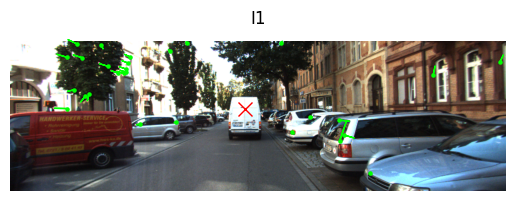

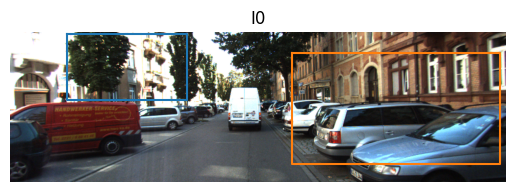

In [107]:
I0 = "000005_10.png"
I1 = "000005_11.png"
run(I0, I1)

In this example, the motion vectors are all pointing in the direction of the camera motion. This makes it easy for the FOE to be located. The FOE is correctly placed to the center of the screen, where the camera is seen to be moving towards. 
The algorithm for finding independent clusters is less sucessful however, because it detected the tree and the car as independently moving even though they are seen to be static. This could be because the motion points were mislead by reflections from the car and the building window or the change in light shining through the tree.

FOE: [690.1729  196.65778]
Camera is moving.


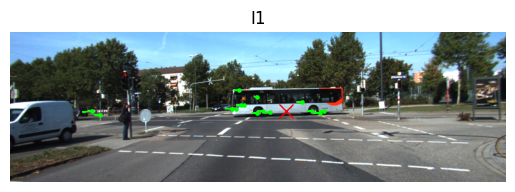

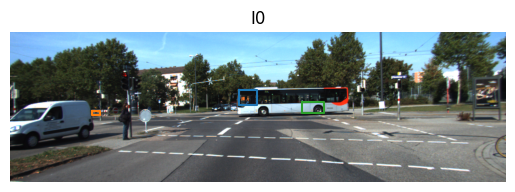

In [108]:
I0 = "000017_10.png"
I1 = "000017_11.png"
run(I0, I1)

Here is an example where the cluster algorithm is successful. It correctly identifies the bu as moving. However it fails to grad the bus as a whole moving object, and rather split it into parts.
The FOE also looks correct because the camera moves towards the middle.


FOE: [196.32819 104.46174]
Camera is moving.


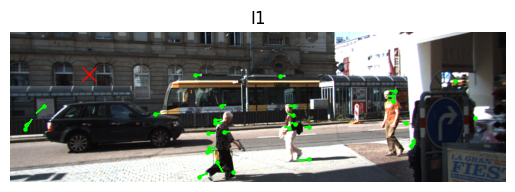

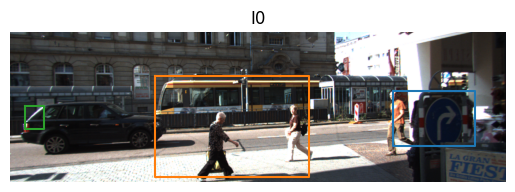

In [109]:
I0= "000169_10.png"
I1= "000169_10_0.png"
run(I0, I1)

This example is interesting because it incorrectly identifies the camera as moving and determins a FOE point. This happens because enough obects are moving in one direction to trick the algorithm into thinking that the camera is in motion.